In [1]:
import numpy as np
import pacmap
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sn
import pandas as pd

import torch
from sklearn.cluster import AgglomerativeClustering

In [3]:
data = np.load("./ne-spectrum/static/human-409b2.data.npy")
labels = np.load("./ne-spectrum/static/human-409b2.labels.npy")

data.shape, labels.shape

((20272, 50), (20272,))

In [4]:
labels[0]

'iPSCs'

In [5]:
np.unique(labels)

array(['EB', 'Neuroectoderm', 'Neuroepithelium', 'Organoid-1M',
       'Organoid-2M', 'Organoid-4M', 'iPSCs'], dtype='<U15')

In [6]:
mapping = {
    "iPSCs": 6,
    "EB": 5,
    "Neuroectoderm": 4,
    "Neuroepithelium": 3,
    "Organoid-1M": 2,
    "Organoid-2M": 1,
    "Organoid-4M": 0
}

labels = np.array([mapping[y] for y in labels])
len(labels), labels[0]

(20272, 6)

In [7]:
np.save("./exp2/data.npy", data)
np.save("./exp2/labels.npy", labels)

# libraries

In [2]:
import torch
from sklearn.cluster import AgglomerativeClustering

In [3]:
def normalise_(zx, zy):
    """normalise coordinates to 0~1

    :param z: normalised coordinates
    """
    if type(zx) == type(torch.ones(1)):
        if torch.min(zx)!=torch.max(zx):
            zx = (zx - torch.min(zx)) / (torch.max(zx) - torch.min(zx))
        if torch.min(zy)!=torch.max(zy):
            zy = (zy - torch.min(zy)) / (torch.max(zy) - torch.min(zy))
        z = torch.hstack([zx.reshape(-1,1), zy.reshape(-1,1)])
    
    if type(zx) == type(np.ones(1)):
        if np.min(zx)!=np.max(zx):
            zx = (zx - np.min(zx)) / (np.max(zx) - np.min(zx))
        if np.min(zy)!=np.max(zy):
            zy = (zy - np.min(zy)) / (np.max(zy) - np.min(zy))
        z = np.hstack([zx.reshape(-1,1), zy.reshape(-1,1)])

    return z

def normalise(z):

    if len(z.shape)==2:
        z = normalise_(z[:,0], z[:,1])
    elif len(z.shape)==3:
        res_li = []
        for i in range(len(z)):
            res_li.append(normalise_(z[i,:,0].squeeze(), z[i,:,1].squeeze()))
        z = torch.stack(res_li, dim=0)
    else:
        print("wrong z.shape")
        exit()

    return z

In [4]:
def draw_z(z, cls, s=25, x_highlight=None, y_highlight=None, save_path=None, display=True, title=None, palette="Spectral", dpi=600):
    """draw data and labels

    :param z: (n, 2) -- 2D data
    :param cls: (n, ) -- label/class for datapoints
    :param s: size, defaults to 25
    """
    
    # re-organise as df
    try:
        tsne_data = np.hstack((z.numpy(), cls.reshape((-1,1)).numpy()))
    except:
        tsne_data = np.hstack((z, cls.reshape((-1,1))))

    tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))
    tsne_df = tsne_df.sort_values("label")

    # draw
    plt.figure(figsize=(10, 10), dpi=dpi)
    
    # main figure
    sn.FacetGrid(tsne_df, hue="label", height=6, palette=palette).map(plt.scatter, "Dim_1", "Dim_2", s=s).add_legend()
    # highlights
    if x_highlight!=None and y_highlight!=None:
        plt.scatter(x_highlight, y_highlight, marker='*', s=20, c='black', label='Highlighted Point')

    # dpi    
    matplotlib.rcParams["figure.dpi"] = dpi
    
    # axes range
    plt.xlim((0, 1))
    plt.ylim((0, 1))

    if title!=None:
        plt.title(title)
    
    if save_path!=None:
        plt.savefig(save_path, bbox_inches='tight')    

    if display==True:
        plt.show()
    else:
        plt.ioff()
        plt.clf()
        plt.close()

# EDA

In [31]:
idx = np.random.choice(data.shape[0], 5000, replace=False)
data1, labels1 = data[idx], labels[idx]
data1.shape, labels1.shape

((5000, 50), (5000,))

In [10]:
pcm = pacmap.PaCMAP(n_components=2, n_neighbors=150, MN_ratio=0.5, FP_ratio=1.0)
z = pcm.fit_transform(data)
z.shape

(20272, 2)

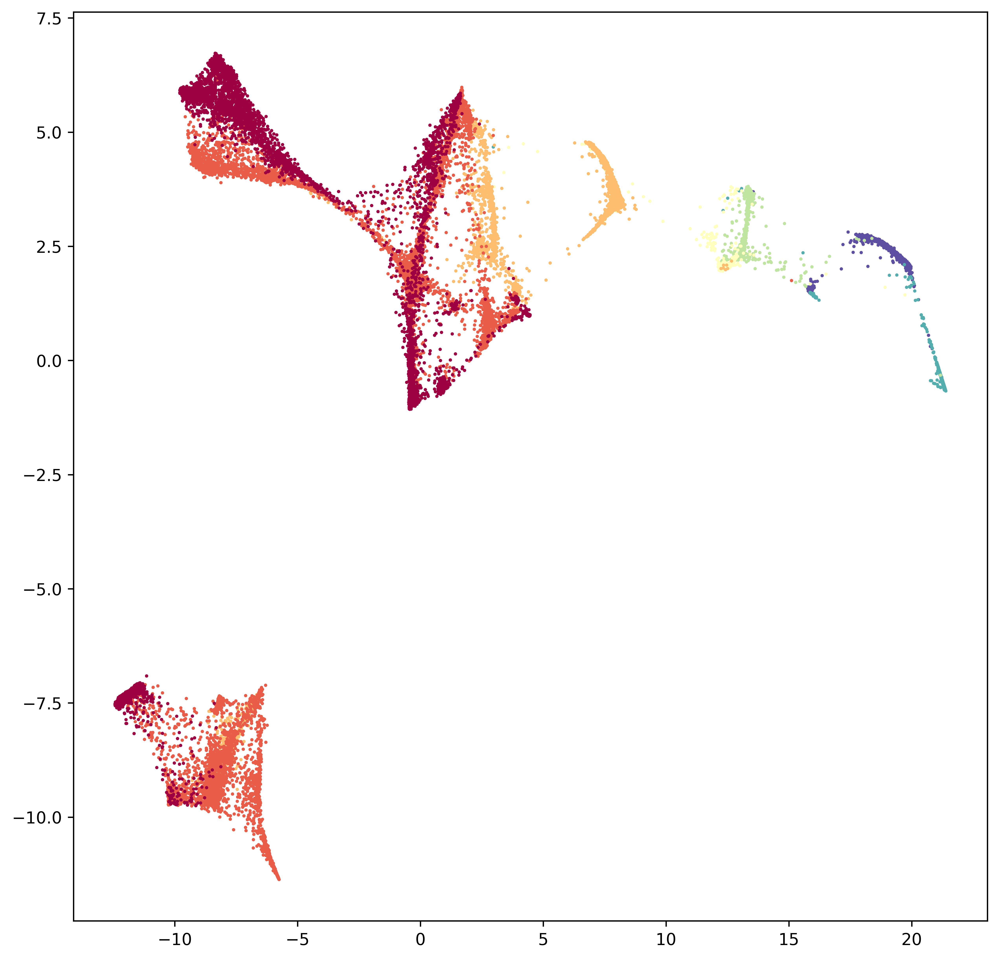

In [11]:
%matplotlib inline
plt.figure(figsize=(10,10), dpi=600)
plt.scatter(z[:,0], z[:,1], s=1, c=labels, cmap='Spectral')
# all default params

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


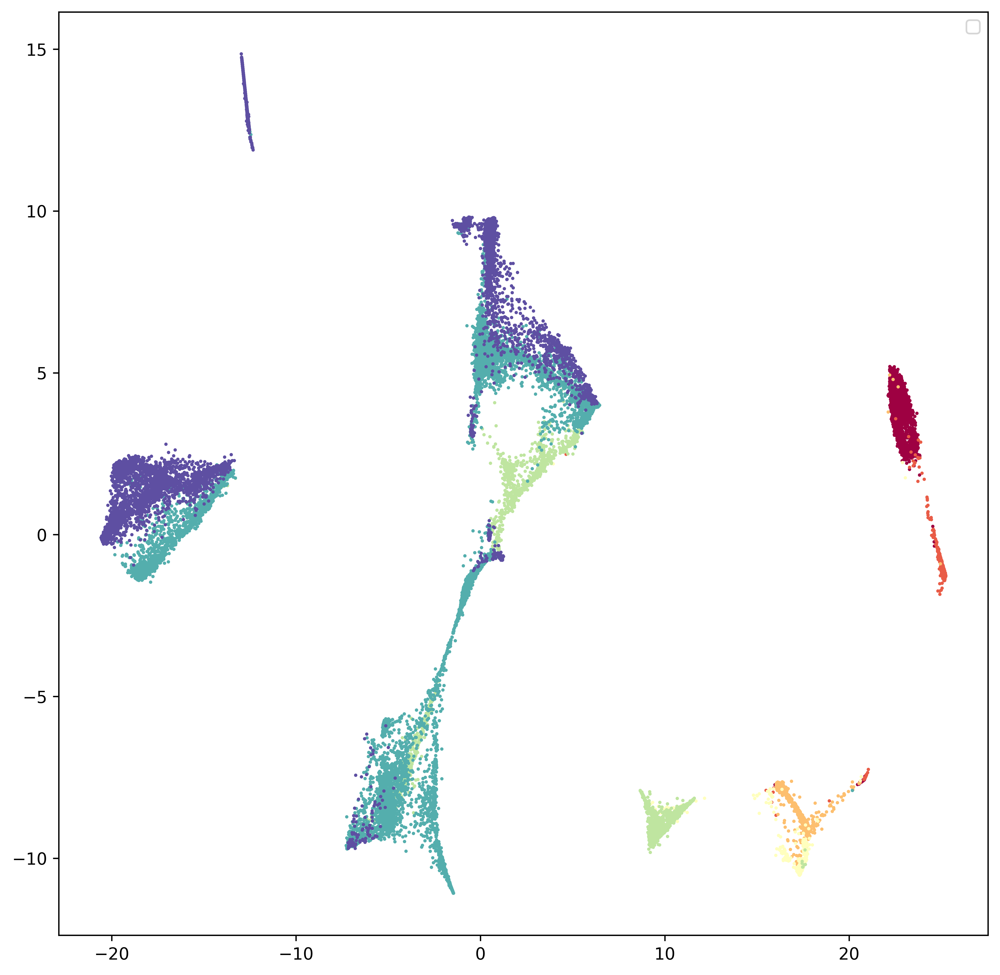

In [25]:
%matplotlib inline
plt.figure(figsize=(10,10), dpi=600)
plt.scatter(z[:,0], z[:,1], s=1, c=labels_int, cmap='Spectral')
# k=150

plt.show()

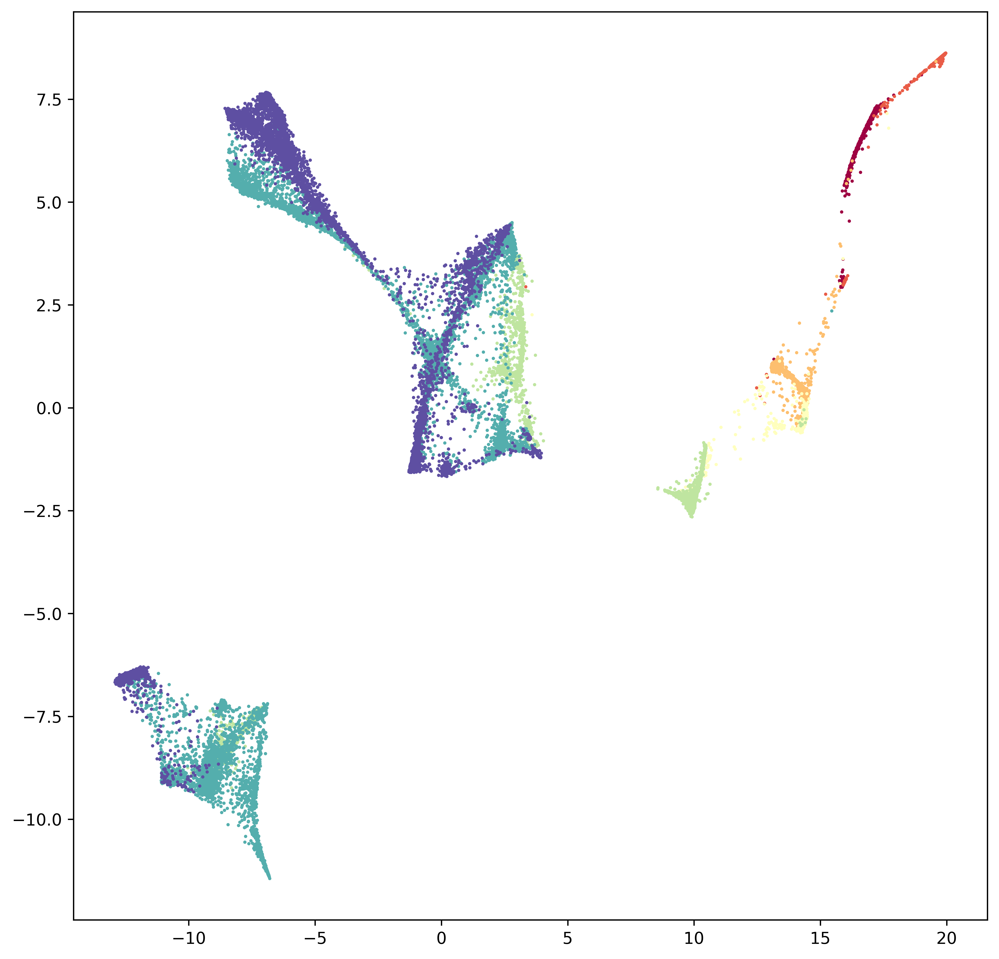

In [30]:
%matplotlib inline
plt.figure(figsize=(10,10), dpi=600)
plt.scatter(z[:,0], z[:,1], s=1, c=labels_int, cmap='Spectral')
# k=150, MN_ratio=0.5, FP_ratio=1.0

plt.show()

In [8]:
pcm = pacmap.PaCMAP(n_components=2, n_neighbors=150, MN_ratio=0.5, FP_ratio=0.5)
z = pcm.fit_transform(data)
z.shape

(20272, 2)

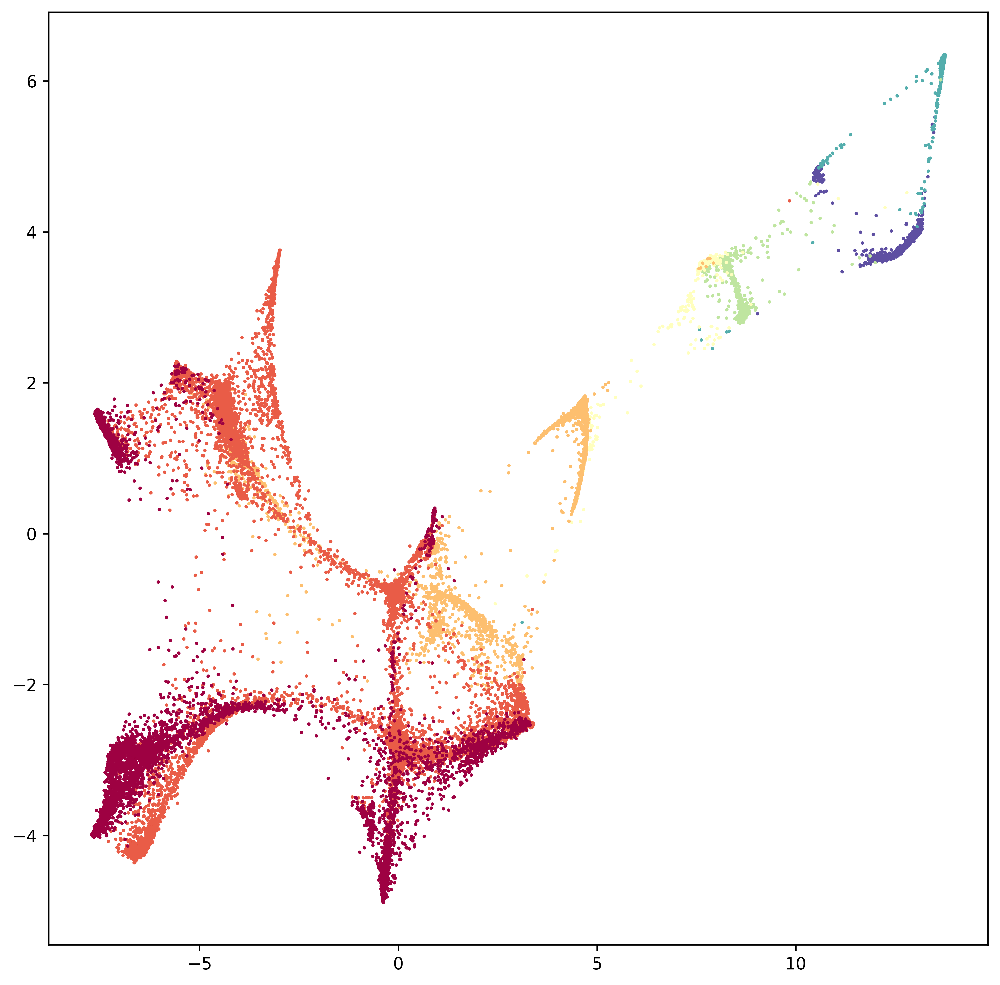

In [9]:
%matplotlib inline
plt.figure(figsize=(10,10), dpi=600)
plt.scatter(z[:,0], z[:,1], s=1, c=labels, cmap='Spectral')
# k=150, MN_ratio=0.5, FP_ratio=1.0 + 20000points

plt.show()

<Figure size 6000x6000 with 0 Axes>

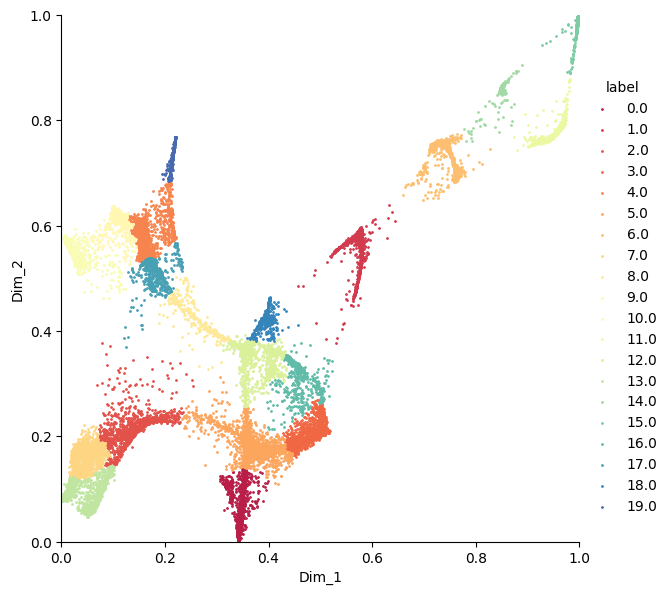

In [15]:
# agc = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5)
agc = AgglomerativeClustering(n_clusters=20)
agc.fit(normalise(z))

%matplotlib inline
draw_z(z=normalise(z), cls=agc.labels_, s=1, display=True)

<Figure size 6000x6000 with 0 Axes>

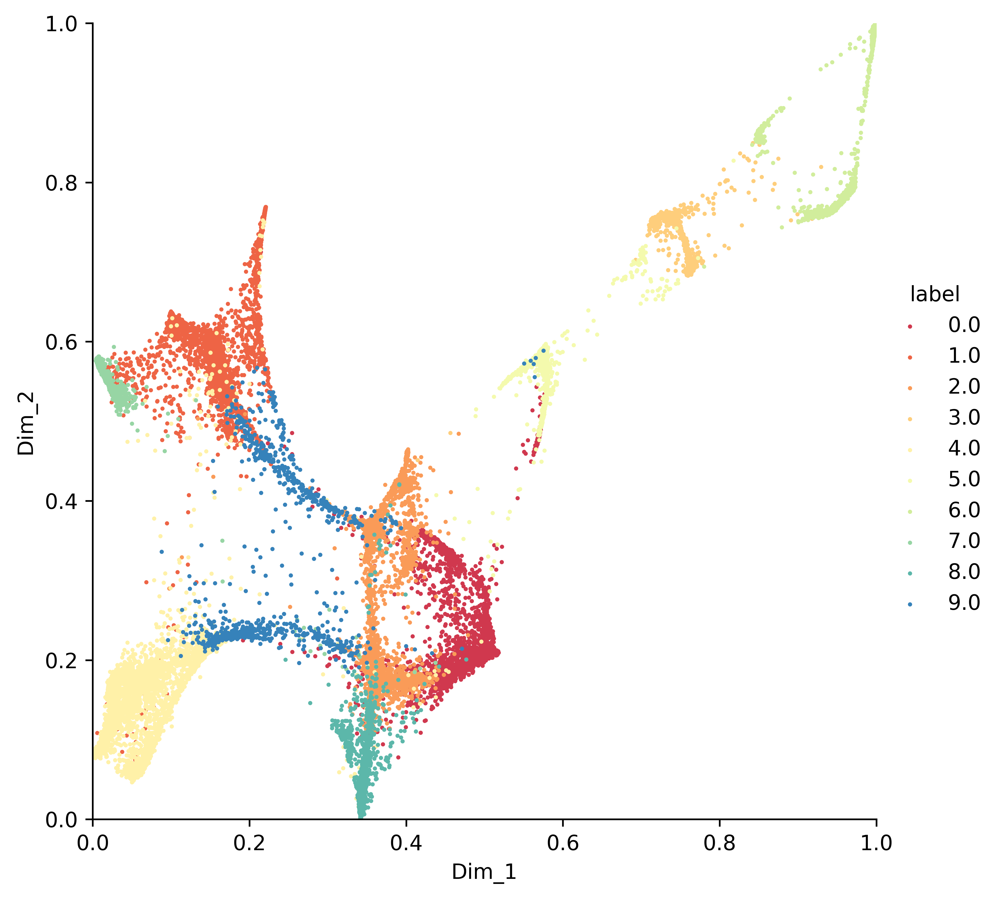

In [17]:
# agc = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5)
agc = AgglomerativeClustering(n_clusters=10)
agc.fit(data)

%matplotlib inline
draw_z(z=normalise(z), cls=agc.labels_, s=1, display=True)

In [52]:
pcm = pacmap.PaCMAP(n_components=3, n_neighbors=150, MN_ratio=0.5, FP_ratio=0.5)
z = pcm.fit_transform(data)
z.shape

(20272, 3)

In [59]:
import plotly.graph_objects as go
import numpy as np

# # Generate random data for the example
# np.random.seed(42)
# x = np.random.rand(100)
# y = np.random.rand(100)
# z = np.random.rand(100)

# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=z[:,0],
    y=z[:,1],
    z=z[:,2],
    mode='markers',
    marker=dict(
        size=1,
        color=labels,
        colorscale='Spectral',  # Use 'Spectral' colormap
        colorbar=dict(
            title='Color Scale'
        ),
    )
    # c=labels, marker='o', cmap='Spectral'
)])

# Set labels for axes
fig.update_layout(
    scene=dict(
        xaxis_title='X Axis',
        yaxis_title='Y Axis',
        zaxis_title='Z Axis'
    )
)

# Save the plot as an HTML file
fig.write_html('interactive_3d_scatter_plot.html')

# Show the plot (optional)
fig.show()


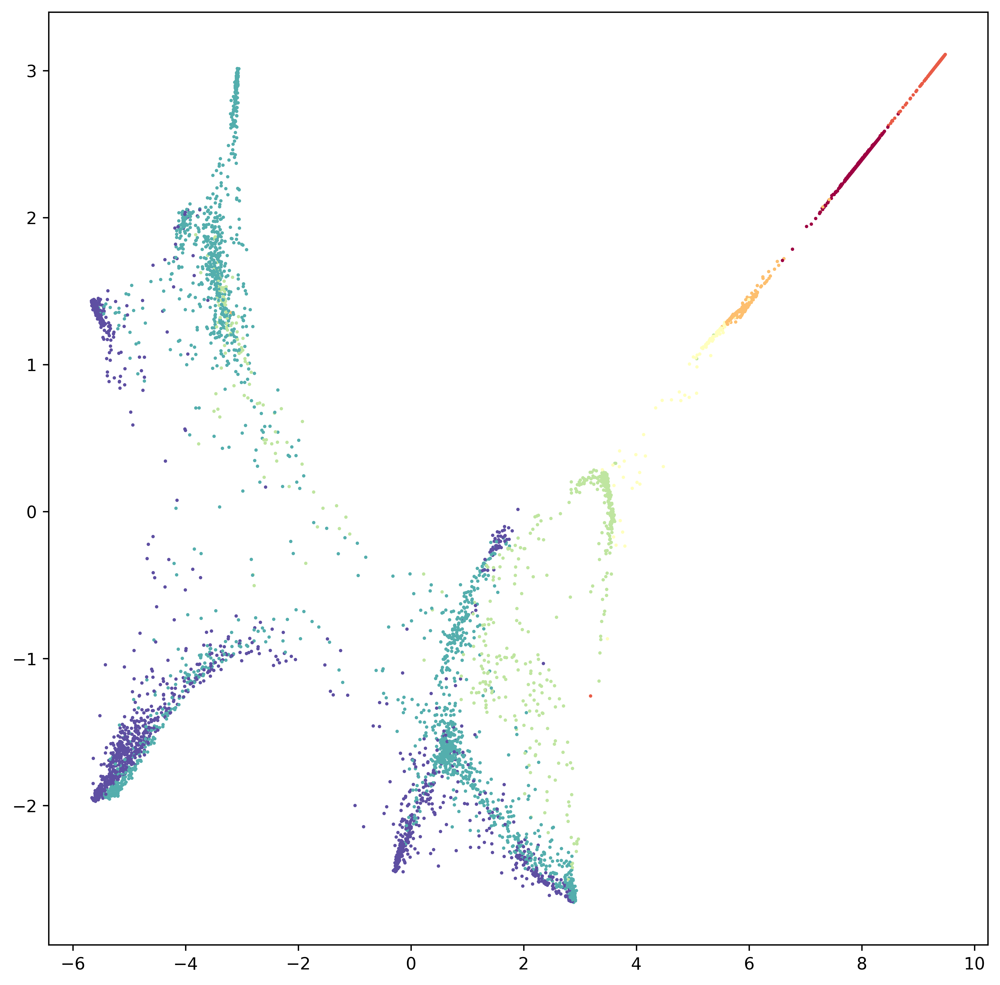

In [38]:
%matplotlib inline
plt.figure(figsize=(10,10), dpi=600)
plt.scatter(z[:,0], z[:,1], s=1, c=labels_int1, cmap='Spectral')
# k=150, MN_ratio=0.5, FP_ratio=0.5 + 5000points

plt.show()

In [19]:
from sklearn.manifold import SpectralEmbedding

le = SpectralEmbedding(n_components=2)

z = le.fit_transform(data)

z.shape

# 4m 56.5s

(20272, 2)

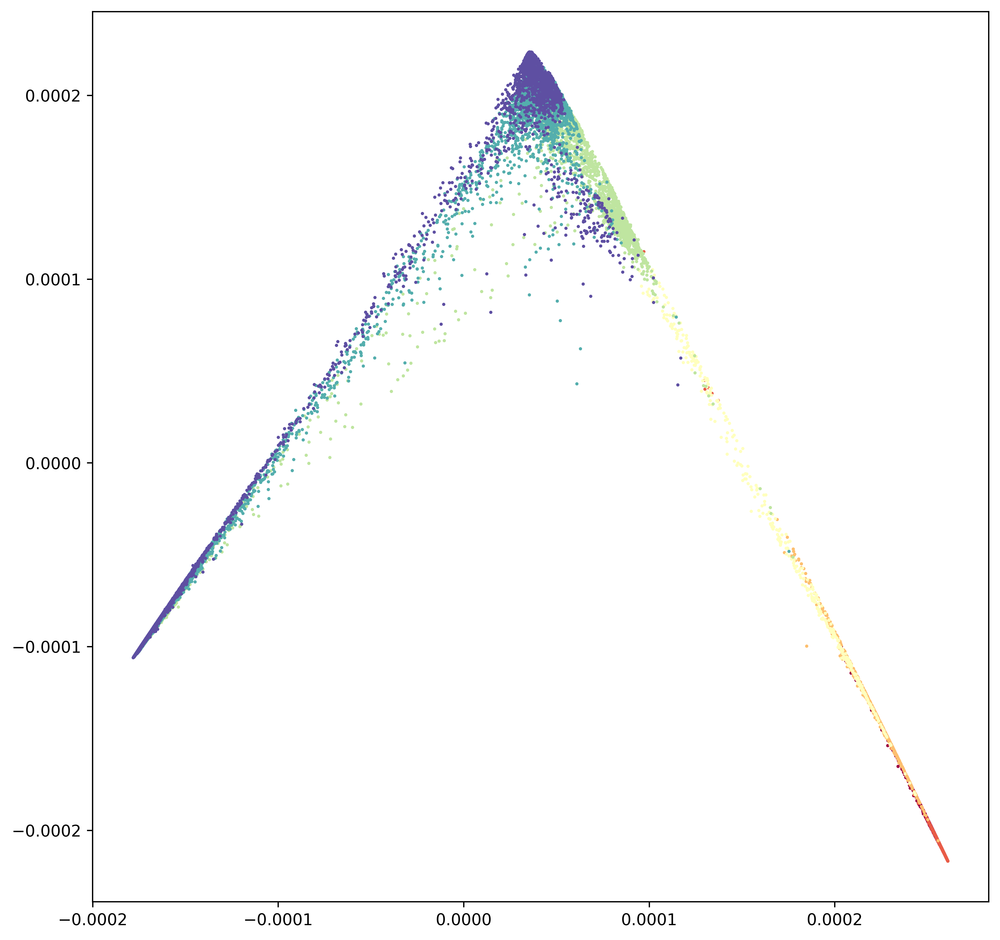

In [21]:
%matplotlib inline
plt.figure(figsize=(10,10), dpi=600)
plt.scatter(z[:,0], z[:,1], s=1, c=labels, cmap='Spectral')
# default + 20000points

plt.show()

In [41]:
agc = AgglomerativeClustering(n_clusters=None, distance_threshold=2.0)
agc.fit(normalise(z))

AgglomerativeClustering(distance_threshold=2.0, n_clusters=None)

<Figure size 6000x6000 with 0 Axes>

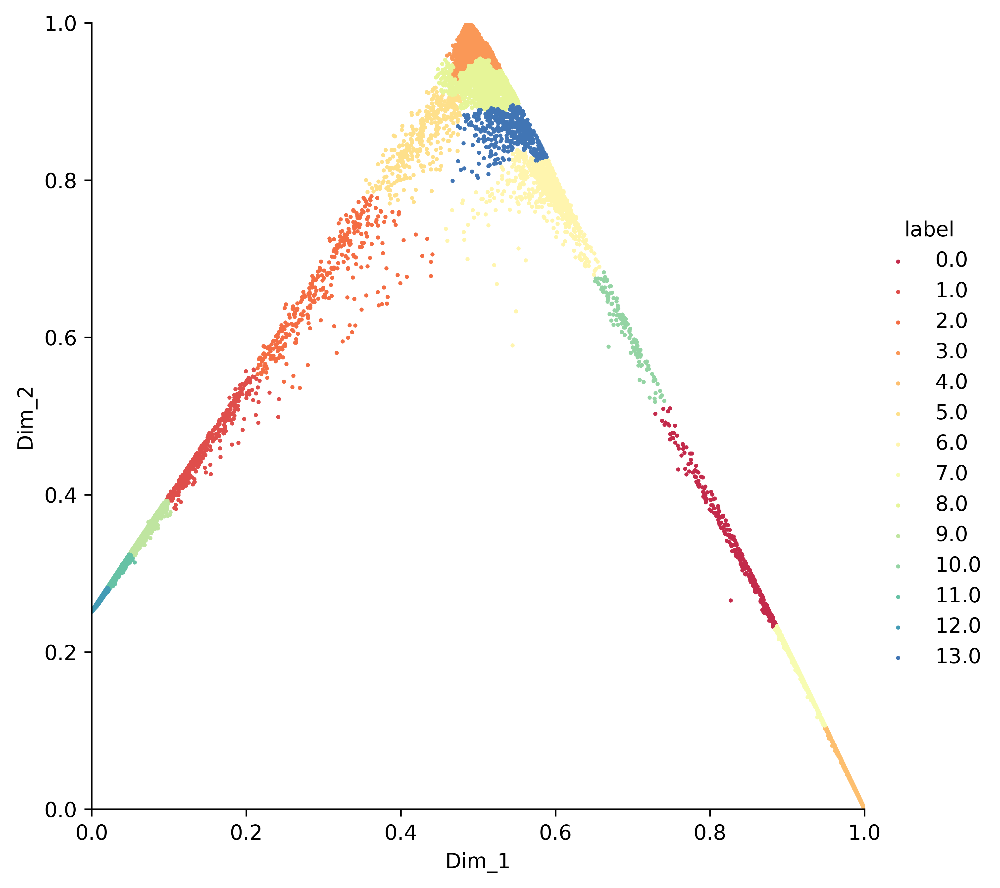

In [42]:
%matplotlib inline
draw_z(z=normalise(z), cls=agc.labels_, s=1, display=True)

In [9]:
chimp_data = np.load("./ne-spectrum/static/chimp.data.npy")
chimp_labels = np.load("./ne-spectrum/static/chimp.labels.npy")

chimp_data.shape, chimp_labels.shape

((36884, 50), (36884,))

In [11]:
np.unique(chimp_labels)

array(['EB', 'Neuroectoderm', 'Neuroepithelium', 'Organoid-1M',
       'Organoid-2M', 'Organoid-3M', 'Organoid-4M', 'iPSCs'], dtype='<U15')

In [12]:
mapping

{'iPSCs': 0,
 'EB': 1,
 'Neuroectoderm': 2,
 'Neuroepithelium': 3,
 'Organoid-1M': 4,
 'Organoid-2M': 5,
 'Organoid-4M': 6}

# data generation

In [12]:
data = np.load("./exp2/data.npy")
labels = np.load("./exp2/labels.npy")

data.shape, labels.shape

((20272, 50), (20272,))

In [ ]:
for k in [None, 50, 100, 150]:
    for m in [0.2, 0.5, 1.0, 5.0, 20.0]:
        for n in [0.5, 1.0, 5.0, 20.0]:
            
            pcm = pacmap.PaCMAP(n_components=2, n_neighbors=150, MN_ratio=0.5, FP_ratio=1.0)
            z = pcm.fit_transform(data)

            np.save("./exp2/z_k{}_m{}_n{}.npy".format(k, m, n), z)

            draw_z(z=normalise(z), cls=labels, s=1, display=False, save_path="./exp2/k{}_m{}_n{}.png".format(k, m, n))

# 92 min

# feedback

In [19]:
import glob

offline = glob.glob("./exp2/z_*.npy")
online = glob.glob("../DVHL/runs/DVHL__ppo__0518143734__3407/z_*.pt")

len(offline), len(online)

(80, 32)

In [21]:
offline_scores = []
online_scores = []

In [28]:
for i in range(len(offline)):
    score = int(input('rate from 1 to 5: {}'.format(offline[i])))
    offline_scores.append(score)

# 5: has partial order (tail), has manifold struc (main body)
# 4: has partial order (tail)
# 3: has manifold struc (main body)
# 2: neither, but has structure
# 1: none

In [30]:
np.save("./exp2/offline_scores.npy", np.array(offline_scores))

In [34]:
for i in range(len(online)):
    score = int(input('rate from 1 to 5: {}'.format(online[i])))
    online_scores.append(score)

# DVHL__ppo__0518143734__3407
# 5: has structure, has partial order, has manifold
# 4: has structure, has partial order
# 3: has structure, has manifold
# 2: no structure, has partial order / manifold
# 1: none

In [35]:
np.save("./exp2/online_scores.npy", np.array(online_scores))

In [39]:
offline = [(offline[i], offline_scores[i]) for i in range(len(offline))]
online = [(online[i], online_scores[i]) for i in range(len(online))]

point_scores = offline+online
len(point_scores)

112

In [42]:
np.save("./exp2/point_scores.npy", np.array(point_scores))

In [62]:
def rotate_anticlockwise(z, times=1):

    R = torch.Tensor([[0, -1], 
                      [1, 0]])

    if type(z)==type(np.ones(1)):
        for i in range(times):
            z = np.dot(z, R)
    
    elif type(z)==type(torch.ones(1)):
        for i in range(times):
            z = torch.matmul(z, R)

    else:
        print("not implemented rotation")
        exit()

    z = normalise(z)

    return z

def flip(z):
    x = z[:, 0]
    y = z[:, 1]
    if np.random.rand()<0.5:
        x = 1 - x
    else:
        y = 1 - y
    # return torch.hstack([x.view(-1,1), y.view(-1,1)])
    return np.hstack([x.reshape(-1,1), y.reshape(-1,1)])

In [64]:
# import os
# from tqdm import tqdm

# cnt = 0

# for idx in tqdm(range(len(point_scores))):

#     if "runs" in point_scores[idx][0]:
#         z = torch.load("../DVHL/runs/DVHL__ppo__0518143734__3407/z_iter1_step{}.pt".format(int(point_scores[idx][0].split("iter1_step")[1].split(".")[0])))
#         z = z.numpy()

#         np.random.shuffle(z)
        
#         yi = point_scores[idx][-1]

#         for j in range(4):
#             zi = rotate_anticlockwise(z=z, times=j)
#             torch.save([zi, yi], "./exp2/data/{}.pt".format(cnt))
#             cnt += 1

#             zi = flip(z=zi)
#             torch.save([zi, yi], "./exp2/data/{}.pt".format(cnt))
#             cnt += 1
#     else:
#         z = np.load(point_scores[idx][0].split("/")[-1].split(".png")[0])
    
#         np.random.shuffle(z)
        
#         yi = point_scores[idx][-1]

#         for i in range(20):
#             zi = z[i*1000:(i+1)*1000]
#             for j in range(4):
#                 zi = rotate_anticlockwise(z=zi, times=j)
#                 torch.save([zi, yi], "./exp2/data/{}.pt".format(cnt))
#                 cnt += 1

#                 zi = flip(z=zi)
#                 torch.save([zi, yi], "./exp2/data/{}.pt".format(cnt))
#                 cnt += 1

#                 # augment to "thicker"?

100%|██████████| 112/112 [00:08<00:00, 13.34it/s]


In [77]:
from utils import *
from compute_feature import *

In [80]:
from tqdm import tqdm

data_offline = np.load("./exp2/data.npy")               # (20000, 50)
labels_offline = np.load("./exp2/labels.npy")           # (20000, )

data_online = np.load("../DVHL/runs/DVHL__ppo__0518143734__3407/data_online_1k.npy")        # (1000, 50)
labels_online = np.load("../DVHL/runs/DVHL__ppo__0518143734__3407/labels_online_1k.npy")    # (1000)

offline_y = np.load("./exp2/offline_scores.npy")             # (48,)
online_y = np.load("./exp2/online_scores.npy")               # (27,)

offline_pairs = []
for i in range(len(offline)):
    for j in range(len(offline)):
        if i==j:
            continue
        else:
            y = 1 if offline_y[i] > offline_y[j] else 0
            offline_pairs.append((i,j,y))

online_pairs = []
for i in range(len(online)):
    for j in range(len(online)):
        if i==j:
            continue
        else:
            y = 1 if online_y[i] > online_y[j] else 0
            online_pairs.append((i,j,y))

offline_features = []
offline_sample_idx = []
for i in tqdm(range(len(offline))):
    z = np.load(offline[i][0])
    idx = np.random.choice(z.shape[0], 1000, replace=False)
    offline_sample_idx.append(idx)
    z = z[idx]
    
    agc = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5)
    agc.fit(normalise(z))
    
    feats = generate_features(z=z, labels=agc.labels_, data=data_offline[idx])
    offline_features.append(feats)

online_features = []
for i in tqdm(range(len(online))):
    z = torch.load(online[i][0]).numpy()

    agc = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5)
    agc.fit(normalise(z))

    feats = generate_features(z=z, labels=agc.labels_, data=data_online)
    online_features.append(feats)

100%|██████████| 32/32 [06:56<00:00, 13.01s/it]


In [82]:
np.save("./exp2/online_pairs.npy", online_pairs)
np.save("./exp2/offline_pairs.npy", offline_pairs)

np.save("./exp2/online_features.npy", online_features)
np.save("./exp2/offline_features.npy", offline_features)

In [83]:
offline_set_X = []
offline_set_y = []
for i in range(len(offline_pairs)):
    idx1 = offline_pairs[i][0]
    idx2 = offline_pairs[i][1]
    y = offline_pairs[i][2]
    
    X = np.hstack([offline_features[idx1], offline_features[idx2]])

    offline_set_X.append(X)
    offline_set_y.append(y)

online_set_X = []
online_set_y = []
for i in range(len(online_pairs)):
    idx1 = online_pairs[i][0]
    idx2 = online_pairs[i][1]
    y = online_pairs[i][2]
    
    X = np.hstack([online_features[idx1], online_features[idx2]])

    online_set_X.append(X)
    online_set_y.append(y)

len(offline_set_X), len(offline_set_y), len(online_set_X), len(online_set_y)

(6320, 6320, 992, 992)

In [84]:
X = np.vstack(offline_set_X + online_set_X)
y = np.hstack(offline_set_y + online_set_y)
X.shape, y.shape

((7312, 28), (7312,))

In [88]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

best = [0.0, 0.0]
best_param = []

for ne in [50,100,200]:
    for md in [8,12,16,32,None]:
        for mss in [2,5,10,20]:
                
                rf = RandomForestClassifier(n_estimators=ne, max_depth=md, min_samples_split=mss)

                scores = cross_val_score(rf, X, y, cv=5)
                if scores.mean() > best[0]:
                    best = [scores.mean(), scores.std()]
                    best_param = [ne, md, mss]
                    print("best param: ", ne, md, mss)
                    print("best acc: ", best[0], best[1])

best param:  50 8 2
best acc:  0.7079956762943299 0.061697561870002304
best param:  50 8 5
best acc:  0.7182537241000773 0.059018809433297
best param:  50 12 5
best acc:  0.7185196544401672 0.07964620203625586
best param:  50 16 2
best acc:  0.7252236423667051 0.07040246378712017
best param:  50 16 10
best acc:  0.7378039053609649 0.07485381362738344
best param:  100 16 2
best acc:  0.7397191835452329 0.07335283220868638
best param:  100 32 5
best acc:  0.7420449519520727 0.07042043449621765


In [90]:
import pickle

rf = RandomForestClassifier(n_estimators=100, max_depth=32, min_samples_split=5)
rf.fit(X, y)
acc = accuracy_score(y_pred=rf.predict(X), y_true=y)
print(acc)

pickle.dump(rf, open("./exp2/rf.pkl", "wb"))

0.999589715536105
